<a href="https://colab.research.google.com/github/venkateswarisudalai/Algorithms_practise/blob/main/rectangleimages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 12844, done.
remote: Total 12844 (delta 0), reused 0 (delta 0), pack-reused 12844
Receiving objects: 100% (12844/12844), 11.82 MiB | 23.14 MiB/s, done.
Resolving deltas: 100% (8927/8927), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.3 MB/s 
     |████████████████████████████████| 145 kB 5.1 MB/s 
     |████████████████████████████████| 178 kB 43.8 MB/s 
     |████████████████████████████████| 1.1 MB 60.9 MB/s 
     |████████████████████████████████| 67 kB 7.1 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 71.0 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datasci

In [3]:
%pwd
%ls

CONTRIBUTING.md  Dockerfile  LICENSE    requirements.txt*  tutorial.ipynb
data/            export.py   models/    setup.cfg          utils/
detect.py        hubconf.py  README.md  train.py           val.py


In [4]:
!pip install roboflow


In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="j9VAmUrVlWGFuNsdj9Lb")
project = rf.workspace("cs5800").project("rectangle-eub3z")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to rectangle-2 in yolov5pytorch:: 100%|██████████| 1392/1392 [00:00<00:00, 1419.38it/s]


In [6]:
%pwd
%ls

CONTRIBUTING.md  export.py   README.md          train.py
data/            hubconf.py  rectangle-2/       tutorial.ipynb
detect.py        LICENSE     requirements.txt*  utils/
Dockerfile       models/     setup.cfg          val.py


In [7]:
%cd rectangle-2/ 

/content/yolov5/rectangle-2


In [8]:
!python /content/yolov5/train.py --img 640 --batch 16 --patience 50 --epochs 300  --data /content/yolov5/rectangle-2/data.yaml  --cache

train: weights=../yolov5s.pt, cfg=, data=/content/yolov5/rectangle-2/data.yaml, hyp=../data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=50, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-134-gc9a3b14 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, deg

In [15]:
pwd

'/content/yolov5/rectangle-2'

In [18]:
%cd ..

/content/yolov5


In [27]:
!python /content/yolov5/detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source /content/yolov5/rectangle-2/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/rectangle-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-134-gc9a3b14 torch 1.10.0+cu111 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/94 /content/yolov5/rectangle-2/test/images/0XJONLH3AXRA_jpg.rf.ffef5c4c987287e551f079a5bd1be954.jpg: 640x640 Done. (0.015s)
image 2/94 /content/yolov5/rectangle-2/test/images/15WGUTBVKV6H_jpg.rf.cac880fb9bc98cb1e31a6a17a7837999.jpg: 640x640 4 syringes, Done. (0.015s)
image 3/94 /content/yolov5/rectangle-2/test/images/1C09K96XN82U_jpg.rf.0a53c4ce

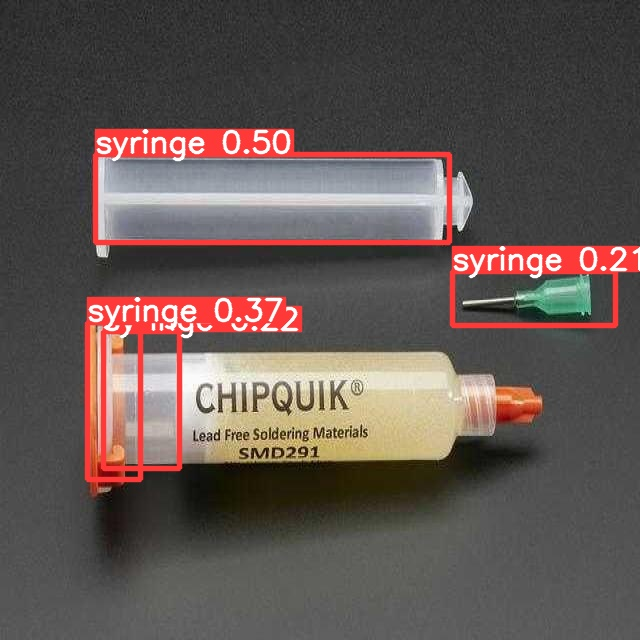

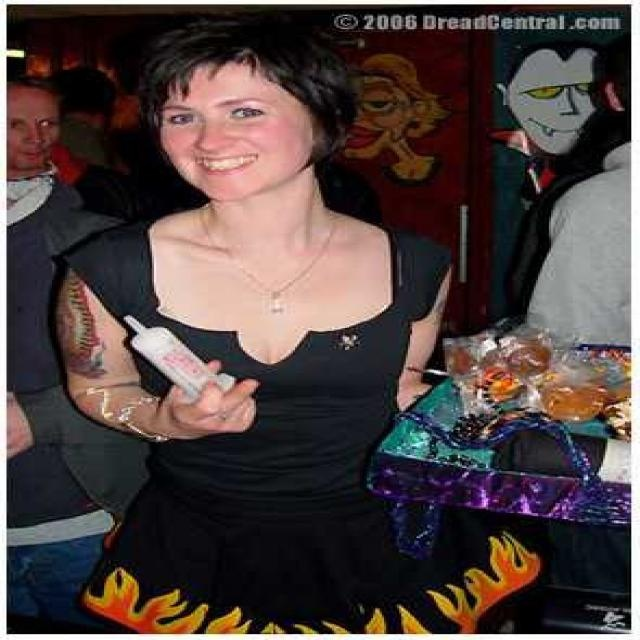

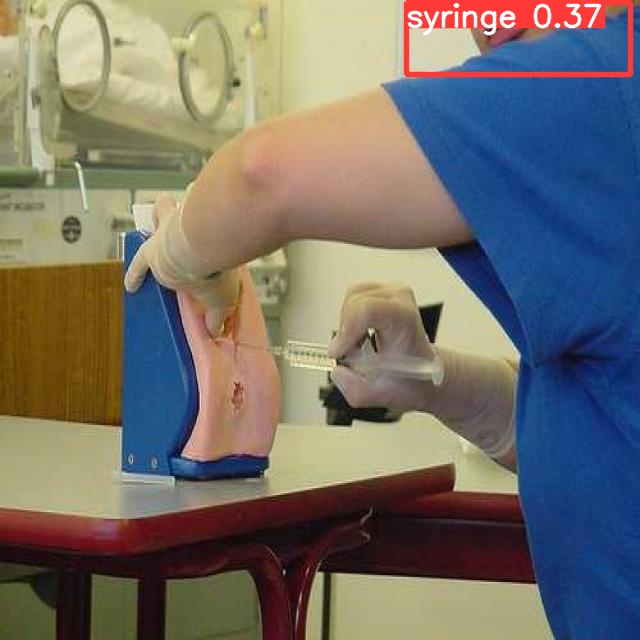

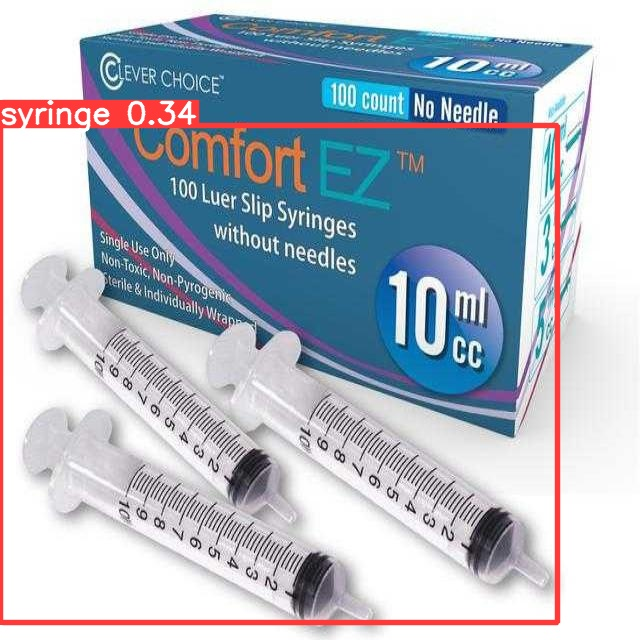

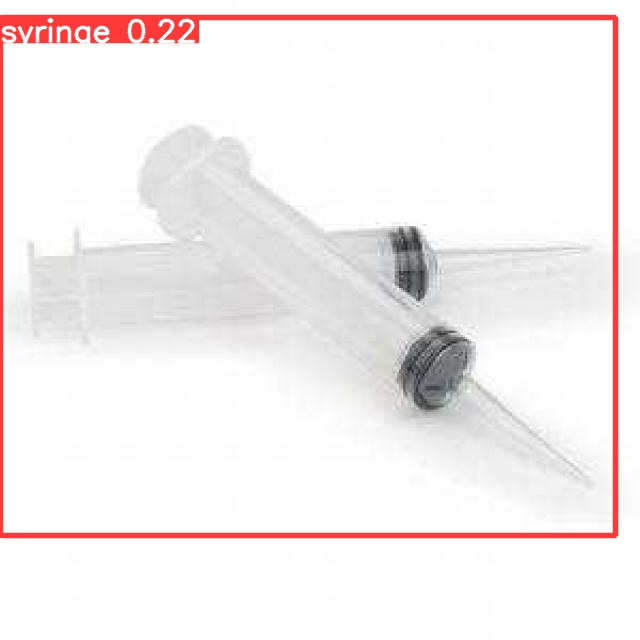

...

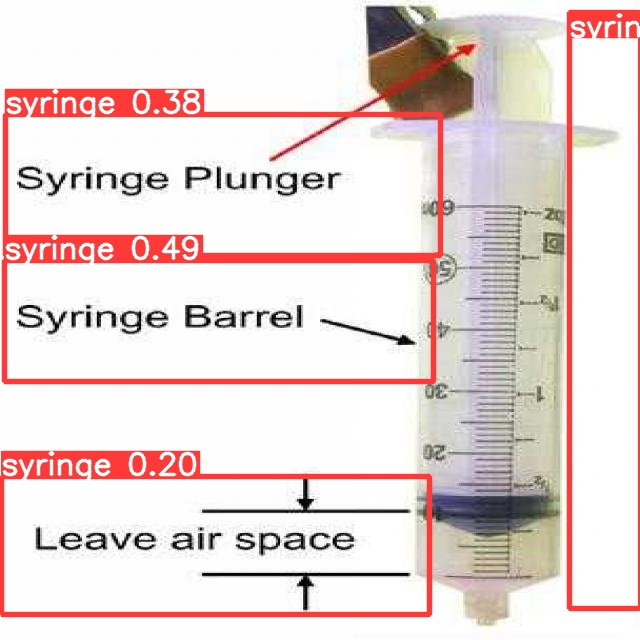

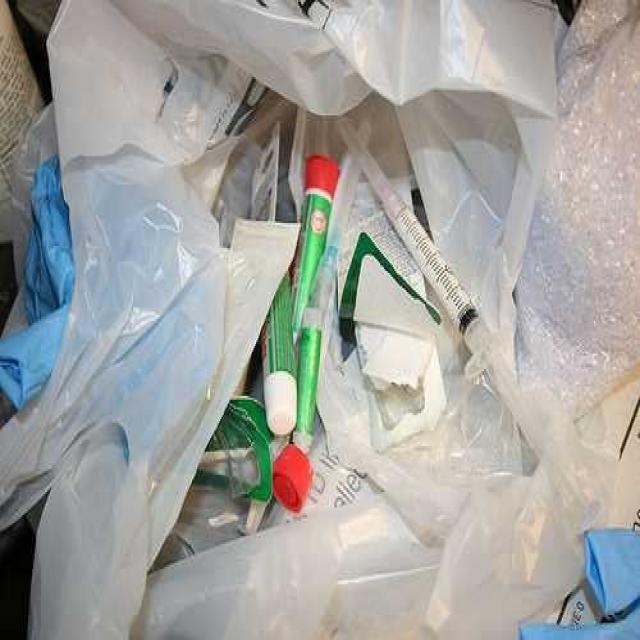

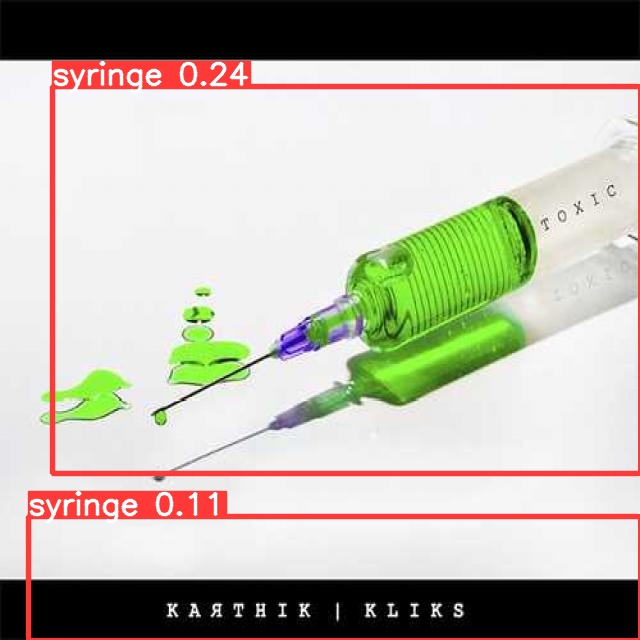

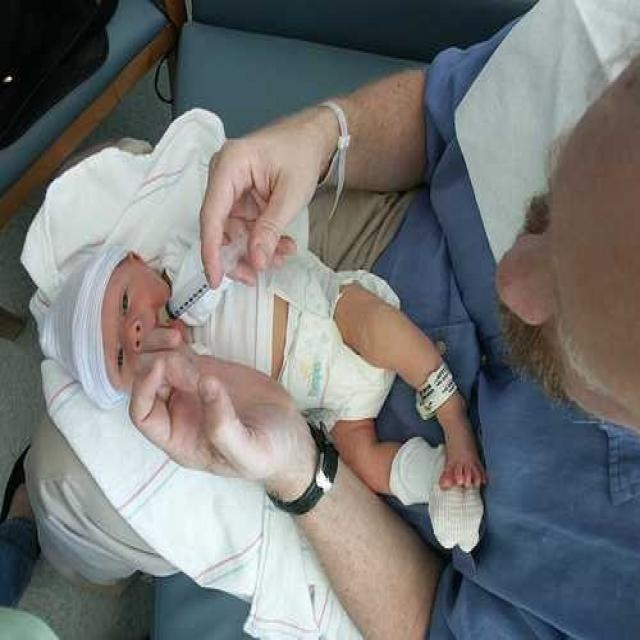

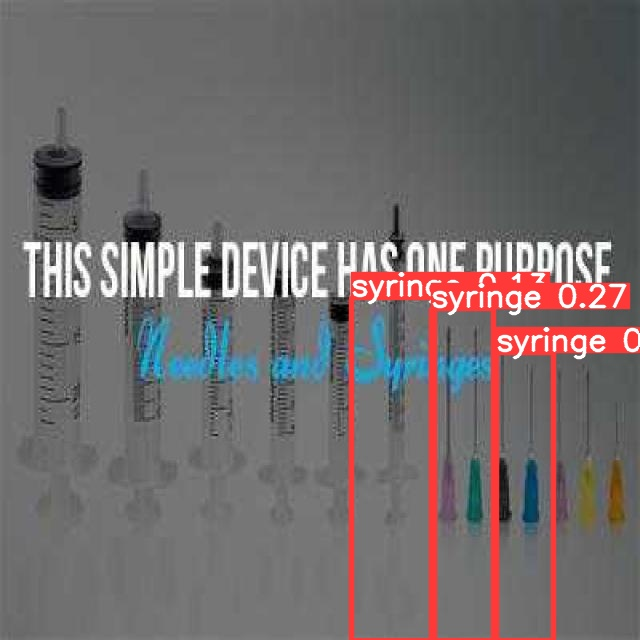

In [28]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp9/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

In [29]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>